# Rossmann Store Sales

<br>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb
import statsmodels.api as sm
import math
import time
import warnings

from statsmodels.tsa.deterministic import Fourier, CalendarFourier, DeterministicProcess
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

%matplotlib inline

warnings.filterwarnings('ignore')

<br>

### Определение метрик и методов анализа временных рядов

[RMSPE](https://help.pecan.ai/en/articles/6456388-model-performance-metrics-for-regression-models#Modelperformancemetricsforregressionmodels-RootMeanSquaredPercentageError(RMSPE)) 
(Root Mean Square Percentage Error) метрика.<br>
Используется далее при обучении XGBoost для прогнозирования значений вместо выбросов.

In [2]:
def ToWeight(y):
    w = np.zeros(y.shape, dtype=float)
    ind = y != 0
    w[ind] = 1./(y[ind]**2)
    return w

def rmspe(yhat, y):
    w = ToWeight(y)
    rmspe = np.sqrt(np.mean( w * (y - yhat)**2 ))
    return rmspe

def rmspe_xg(yhat, y):
    y = y.get_label()
    y = np.exp(y) - 1
    yhat = np.exp(yhat) - 1
    w = ToWeight(y)
    rmspe = np.sqrt(np.mean(w * (y - yhat)**2))
    return "rmspe", rmspe

In [3]:
# вспомогательный метод для рисования графиков запаздывания (plot_lags)

def lagplot(x, y=None, lag=1, standardize=False, ax=None, **kwargs):
    from matplotlib.offsetbox import AnchoredText
    x_ = x.shift(lag)
    if standardize:
        x_ = (x_ - x_.mean()) / x_.std()
    if y is not None:
        y_ = (y - y.mean()) / y.std() if standardize else y
    else:
        y_ = x
    corr = y_.corr(x_)
    if ax is None:
        fig, ax = plt.subplots()
    scatter_kws = dict(
        alpha=0.75,
        s=3,
    )
    line_kws = dict(color='C3', )
    ax = sns.regplot(x=x_,
                     y=y_,
                     scatter_kws=scatter_kws,
                     line_kws=line_kws,
                     lowess=True,
                     ax=ax,
                     **kwargs)
    at = AnchoredText(
        f"{corr:.2f}",
        prop=dict(size="large"),
        frameon=True,
        loc="upper left",
    )
    at.patch.set_boxstyle("square, pad=0.0")
    ax.add_artist(at)
    ax.set(title=f"Lag {lag}", xlabel=x_.name, ylabel=y_.name)
    return ax


# графики запаздывания

def plot_lags(x, y=None, lags=6, nrows=1, lagplot_kwargs={}, **kwargs):

    """
    Params:
        X, y - данные
        lags - лаги, для которых будут строиться графики запаздывания
        nrows - количество выводимых строк
    """
        
    kwargs.setdefault('nrows', nrows)
    kwargs.setdefault('ncols', math.ceil(lags / nrows))
    kwargs.setdefault('figsize', (kwargs['ncols'] * 2, nrows * 2 + 0.5))
    fig, axs = plt.subplots(sharex=True, sharey=True, squeeze=False, **kwargs)
    for ax, k in zip(fig.get_axes(), range(kwargs['nrows'] * kwargs['ncols'])):
        if k + 1 <= lags:
            ax = lagplot(x, y, lag=k + 1, ax=ax, **lagplot_kwargs)
            ax.set_title(f"Lag {k + 1}", fontdict=dict(fontsize=14))
            ax.set(xlabel="", ylabel="")
        else:
            ax.axis('off')
    plt.setp(axs[-1, :], xlabel=x.name)
    plt.setp(axs[:, 0], ylabel=y.name if y is not None else x.name)
    fig.tight_layout(w_pad=0.1, h_pad=0.1)
    return fig


# сезонный график

def seasonal_plot(X, y, period, freq, ax=None):
    
    """
    Params:
        X, y - данные
        period - индикаторы сезонов
        freq - индикаторы элементов внутри сезонов (для сопоставления значений в разных сезонах)
    """
    
    if ax is None:
        _, ax = plt.subplots()
    palette = sns.color_palette("husl", n_colors=X[period].nunique(),)
    ax = sns.lineplot(
        x=freq,
        y=y,
        hue=period,
        data=X,
        ci=False,
        ax=ax,
        palette=palette,
        legend=False,
    )
    ax.set_title(f"Seasonal Plot ({period}/{freq})")
    for line, name in zip(ax.lines, X[period].unique()):
        y_ = line.get_ydata()[-1]
        ax.annotate(
            name,
            xy=(1, y_),
            xytext=(6, 0),
            color=line.get_color(),
            xycoords=ax.get_yaxis_transform(),
            textcoords="offset points",
            size=14,
            va="center",
        )
    return ax


In [4]:
# периодограмма

def plot_periodogram(ts, detrend='linear', ax=None):
    from scipy.signal import periodogram
    fs = pd.Timedelta("1Y") / pd.Timedelta("1D")
    freqencies, spectrum = periodogram(
        ts,
        fs=fs,
        detrend=detrend,
        window="boxcar",
        scaling='spectrum',
    )
    if ax is None:
        _, ax = plt.subplots()
    ax.step(freqencies, spectrum, color="purple")
    ax.set_xscale("log")
    ax.set_xticks([1, 2, 4, 6, 12, 26, 52, 104])
    ax.set_xticklabels(
        [
            "Annual (1)",
            "Semiannual (2)",
            "Quarterly (4)",
            "Bimonthly (6)",
            "Monthly (12)",
            "Biweekly (26)",
            "Weekly (52)",
            "Semiweekly (104)",
        ],
        rotation=90,
    )
    ax.ticklabel_format(axis="y", style="sci", scilimits=(0, 0))
    ax.set_ylabel("Variance")
    ax.set_title("Periodogram")
    return ax


<br>

### Загрузка данных

<br>

In [5]:
train = pd.read_csv('train.csv', 
                     nrows=None,
                     parse_dates=['Date'],
                     date_parser=(lambda dt: pd.to_datetime(dt, format='%Y-%m-%d')))

test = pd.read_csv('test.csv', 
                    nrows=None,
                    parse_dates=['Date'],
                    date_parser=(lambda dt: pd.to_datetime(dt, format='%Y-%m-%d')))

stores = pd.read_csv('store.csv', nrows=None)

Файлы `train.csv`, `test.csv` и `store.csv` взяты из [Rossmann Store Sales](https://www.kaggle.com/c/rossmann-store-sales/data).

`train.csv`, `test.csv` - информация о продажах (обучающий и тестовый набор)<br>
`store.csv` - информация о магазинах

`train.csv`, `test.csv`:
- **Id** - идентификатор, представляющий пару (Store, Date) в тестовом наборе.
- **Store** - идентификатор магазина
- **Sales** - продажи в данный день (то, что нужно прогнозировать)
- **Customers** - количество клиентов в данный день 
- **Open** - был ли магазин открыт: 0 = закрыт, 1 = открыт
- **Promo** - действует ли в магазине акция в этот день: 0 = не действует, 1 = действует
- **StateHoliday** - бы ли в данный день государственный праздник. <br>
  Обычно все магазины, за редким исключением, закрыты в   
  государственные праздники. Обратите внимание, что все школы закрыты в праздничные и выходные дни.<br> 
  a = государственный праздник, b = праздник Пасхи, c = Рождество, 0 = нет
- **SchoolHoliday** - указывает, повлияло ли на пару (Store, Date) закрытие государственных школ.


`store.csv`: 
- **StoreType** - модель магазина: a, b, c, d.
- **Assortment** - тип ассортимента: a = базовый, b = дополнительный, c = расширенный
- **CompetitionDistance** - расстояние в метрах до ближайшего магазина конкурента
- **CompetitionOpenSince[Month/Year]** - примерный год и месяц открытия ближайшего конкурента
- **Promo2** - участвует ли в постоянной акции: 0 = магазин не участвует, 1 = магазин участвует
- **Promo2Since[Year/Week]** - год и календарная неделя, когда магазин начал участвовать в Promo2.
- **PromoInterval** - описывает последовательные интервалы запуска Promo2, указывая месяцы, в которые акция начинается заново.<br> 
  Например, «Фев, май, август, ноябрь» означает, что каждый раунд начинается в феврале, мае, августе, ноябре любого данного года 
  для этого магазина.


In [6]:
train

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
0,1,5,2015-07-31,5263,555,1,1,0,1
1,2,5,2015-07-31,6064,625,1,1,0,1
2,3,5,2015-07-31,8314,821,1,1,0,1
3,4,5,2015-07-31,13995,1498,1,1,0,1
4,5,5,2015-07-31,4822,559,1,1,0,1
...,...,...,...,...,...,...,...,...,...
1017204,1111,2,2013-01-01,0,0,0,0,a,1
1017205,1112,2,2013-01-01,0,0,0,0,a,1
1017206,1113,2,2013-01-01,0,0,0,0,a,1
1017207,1114,2,2013-01-01,0,0,0,0,a,1


In [7]:
test

,Id,Store,DayOfWeek,Date,Open,Promo,StateHoliday,SchoolHoliday
0,1,1,4,2015-09-17,1.0,1,0,0
1,2,3,4,2015-09-17,1.0,1,0,0
2,3,7,4,2015-09-17,1.0,1,0,0
3,4,8,4,2015-09-17,1.0,1,0,0
4,5,9,4,2015-09-17,1.0,1,0,0
...,...,...,...,...,...,...,...,...
41083,41084,1111,6,2015-08-01,1.0,0,0,0
41084,41085,1112,6,2015-08-01,1.0,0,0,0
41085,41086,1113,6,2015-08-01,1.0,0,0,0
41086,41087,1114,6,2015-08-01,1.0,0,0,0


In [8]:
stores

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
1,2,a,a,570.0,11.0,2007.0,1,13.0,2010.0,"Jan,Apr,Jul,Oct"
2,3,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
3,4,c,c,620.0,9.0,2009.0,0,NaN,NaN,NaN
4,5,a,a,29910.0,4.0,2015.0,0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
1110,1111,a,a,1900.0,6.0,2014.0,1,31.0,2013.0,"Jan,Apr,Jul,Oct"
1111,1112,c,c,1880.0,4.0,2006.0,0,NaN,NaN,NaN
1112,1113,a,c,9260.0,NaN,NaN,0,NaN,NaN,NaN
1113,1114,a,c,870.0,NaN,NaN,0,NaN,NaN,NaN


In [9]:
# столбец-признак отличающий обучающий набор от тестового

train['Set'] = 1
test['Set'] = 0

In [10]:
# соединим последовательно train и test

sales = pd.concat([train, test])

In [11]:
# имена столбцов признаков и ответов для предсказания значений вместо выбросов моделью xgboost

features_x = ['Store', 'Date', 'DayOfWeek', 'Open', 'Promo', 'SchoolHoliday', 'StateHoliday']
features_y = ['SalesLog']

In [12]:
# удалим строки где магазин открыт но продаж нет (так как все дни когда продажи равны 0 не учитываются)

sales = sales.loc[~((sales['Open'] == 1) & (sales['Sales'] == 0))]

In [13]:
# прологарифмируем Sales и положим в новый столбец SalesLog

sales.loc[sales['Set'] == 1, 'SalesLog'] = np.log1p(sales.loc[sales['Set'] == 1]['Sales'])

In [14]:
# превратим признак StateHoliday, StoreType и Assortment в категориальные признаки

sales['StateHoliday'] = sales['StateHoliday'].astype('category').cat.codes
stores['StoreType'] = stores['StoreType'].astype('category').cat.codes
stores['Assortment'] = stores['Assortment'].astype('category').cat.codes

In [15]:
# для каждой даты создадим отдельный столбец для дня, недели, месяца, года, дня года

date_name = 'Date'

sales[date_name + 'Day'] = pd.Index(sales[date_name]).day
sales[date_name + 'Week'] = pd.Index(sales[date_name]).week
sales[date_name + 'Month'] = pd.Index(sales[date_name]).month
sales[date_name + 'Year'] = pd.Index(sales[date_name]).year
sales[date_name + 'DayOfYear'] = pd.Index(sales[date_name]).dayofyear


features_x.remove(date_name)
features_x.extend([date_name + 'Day', 
                   date_name + 'Week', 
                   date_name + 'Month', 
                   date_name + 'Year', 
                   date_name + 'DayOfYear'])

In [16]:
# для каждой даты посчитаем эпохальное время - количество наносекунд от начала 1970 года

sales['DateInt'] = sales['Date'].astype(np.int64)

In [17]:
# метод который конвертирует столбцы открытия ближайшего конкурента CompetitionOpenSince[Month/Year] в дату

def convertCompetitionOpen(df):
    try:
        date = '{}-{}'.format(int(df['CompetitionOpenSinceYear']), int(df['CompetitionOpenSinceMonth']))
        return pd.to_datetime(date)
    except:
        return np.nan

    
# создадим столбец CompetitionOpenInt - эпохальное время открытия ближайшего конкурента

stores['CompetitionOpenInt'] = stores.apply(lambda df: convertCompetitionOpen(df), axis=1).astype(np.int64)

In [18]:
# метод который конвертирует столбцы когда магазин начал участвовать в Promo2 CompetitionOpenSince[Month/Year] в дату

def convertPromo2(df):
    try:
        date = '{}{}1'.format(int(df['Promo2SinceYear']), int(df['Promo2SinceWeek']))
        return pd.to_datetime(date, format='%Y%W%w')
    except:
        return np.nan

    
# создадим столбец Promo2SinceFloat - эпохальное время когда магазин начал участвовать в Promo2

stores['Promo2SinceFloat'] = stores.apply(lambda df: convertPromo2(df), axis=1).astype(np.int64)

In [19]:
# для каждого из 4 интервалов в PromoInterval создадим отдельный столбец

s = stores['PromoInterval'].str.split(',').apply(pd.Series)
s.columns = ['PromoInterval0', 'PromoInterval1', 'PromoInterval2', 'PromoInterval3']
stores = stores.join(s)

In [20]:
# метод который возвращает номер месяца по его названию

def monthToNum(date):
    return{
            'Jan' : 1,
            'Feb' : 2,
            'Mar' : 3,
            'Apr' : 4,
            'May' : 5,
            'Jun' : 6,
            'Jul' : 7,
            'Aug' : 8,
            'Sept' : 9, 
            'Oct' : 10,
            'Nov' : 11,
            'Dec' : 12
    }[date]


# названия месяца преобразуем в номер

for promo_interval in ['PromoInterval0', 'PromoInterval1', 'PromoInterval2', 'PromoInterval3']:
    stores[promo_interval] = stores[promo_interval].map(lambda x: monthToNum(x) if str(x) != 'nan' else np.nan)

del stores['PromoInterval']

In [21]:
# добавим полученные признаки в features_x (кроме Promo2SinceFloat, PromoInterval1, PromoInterval2, PromoInterval3)
# Признаки PromoInterval1, PromoInterval2, PromoInterval3 не улучшают качество модели

store_features = ['Store', 'StoreType', 'Assortment', 
                  'CompetitionDistance', 'CompetitionOpenInt',
                  'PromoInterval0']

features_x = list(set(features_x + store_features))

sales = pd.merge(sales, stores[store_features], how='left', on=['Store'])

In [22]:
# преобразуем все NAN в -1

for feature in features_x:
    sales[feature] = sales[feature].fillna(-1)

In [23]:
# у 622 магазина по какой-то причине некоторые значения Open которые должны быть равны 1 равны -1. 

sales.loc[(sales['Set'] == 0) & (sales['Store'] == 622)]

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Set,...,DateWeek,DateMonth,DateYear,DateDayOfYear,DateInt,StoreType,Assortment,CompetitionDistance,CompetitionOpenInt,PromoInterval0
1017634,622,4,2015-09-17,NaN,NaN,-1.0,1,1,0,0,...,38,9,2015,260,1442448000000000000,0,2,-1.0,-9223372036854775808,-1.0
1018490,622,3,2015-09-16,NaN,NaN,-1.0,1,1,0,0,...,38,9,2015,259,1442361600000000000,0,2,-1.0,-9223372036854775808,-1.0
1019346,622,2,2015-09-15,NaN,NaN,-1.0,1,1,0,0,...,38,9,2015,258,1442275200000000000,0,2,-1.0,-9223372036854775808,-1.0
1020202,622,1,2015-09-14,NaN,NaN,-1.0,1,1,0,0,...,38,9,2015,257,1442188800000000000,0,2,-1.0,-9223372036854775808,-1.0
1021058,622,7,2015-09-13,NaN,NaN,0.0,0,1,0,0,...,37,9,2015,256,1442102400000000000,0,2,-1.0,-9223372036854775808,-1.0
1021914,622,6,2015-09-12,NaN,NaN,-1.0,0,1,0,0,...,37,9,2015,255,1442016000000000000,0,2,-1.0,-9223372036854775808,-1.0
1022770,622,5,2015-09-11,NaN,NaN,-1.0,0,1,0,0,...,37,9,2015,254,1441929600000000000,0,2,-1.0,-9223372036854775808,-1.0
1023626,622,4,2015-09-10,NaN,NaN,-1.0,0,1,0,0,...,37,9,2015,253,1441843200000000000,0,2,-1.0,-9223372036854775808,-1.0
1024482,622,3,2015-09-09,NaN,NaN,-1.0,0,1,0,0,...,37,9,2015,252,1441756800000000000,0,2,-1.0,-9223372036854775808,-1.0
1025338,622,2,2015-09-08,NaN,NaN,-1.0,0,1,0,0,...,37,9,2015,251,1441670400000000000,0,2,-1.0,-9223372036854775808,-1.0


In [24]:
# Исправим это (заменим на 1)

cond = (sales['Set'] == 0) & (sales['Store'] == 622)

sales.loc[cond, 'Open'] = sales.loc[cond, 'Open'].replace(-1, 1)

<br>
выведем некоторые странные ряды (с разрывом, с выбросом) обучающего набора (номера указаны в stores_to_check):

In [25]:
def plot_sales(stores, data, fmt):

    fig = plt.figure(figsize=(20, len(stores_to_check) * 5))

    for i, store in enumerate(stores):

        # только значения когда магазин открыт
        
        cond = (sales['Set'] == 1) & (data['Store'] == store) & (data['Open'] == 1)

        X = data.loc[cond]
        y = data.loc[cond]['Sales']

        plt.subplot(len(stores), 1, i+1)
        plt.plot(X['DateInt'], y, fmt)
        plt.minorticks_on()
        plt.grid(True, which='both')
        plt.title(store)

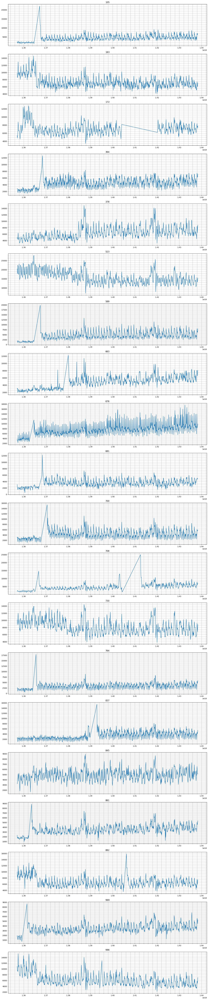

In [26]:
stores_to_check = [105, 163, 172, 364, 378, 523, 589, 663, 676, 681, 
                   700, 708, 730, 764, 837, 845, 861, 882, 969, 986]

plot_sales(stores_to_check, sales, '-')    

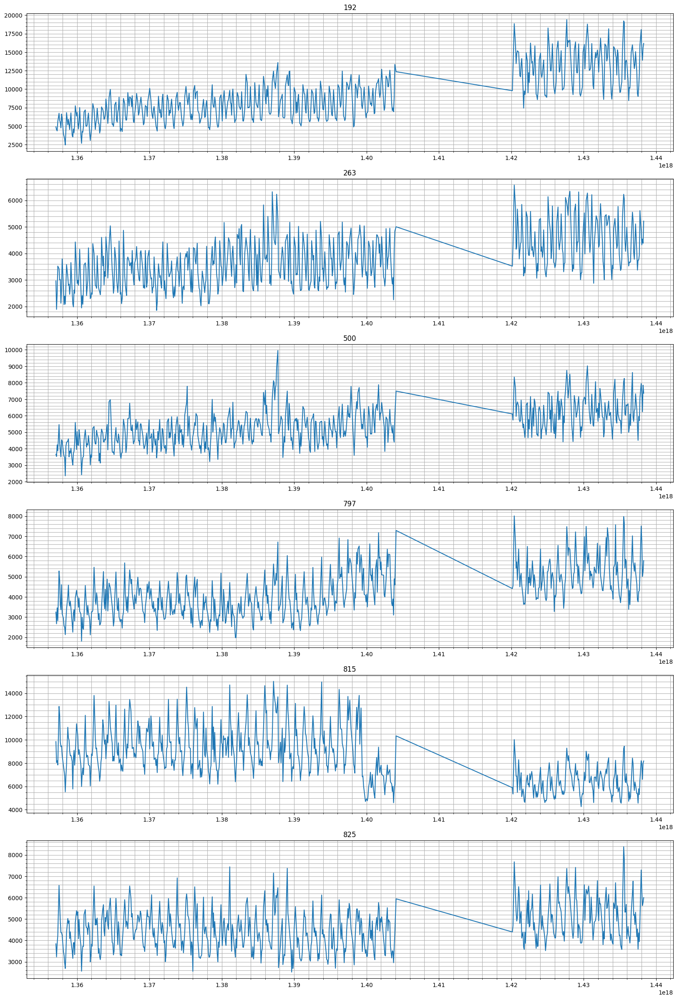

In [27]:
stores_to_check = [192, 263, 500, 797, 815, 825]

plot_sales(stores_to_check, sales, '-')

<br>
Выведем несколько обычных рядов в виде точек

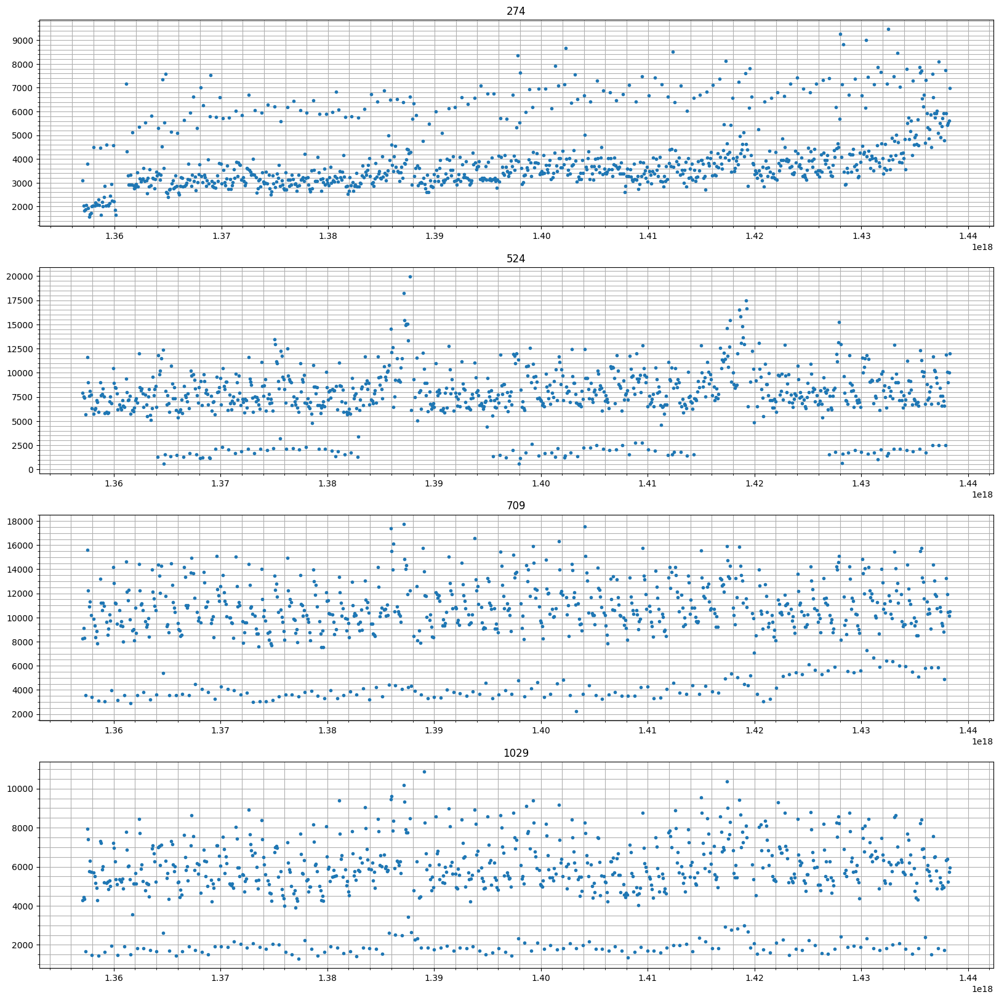

In [28]:
stores_to_check = [274, 524, 709, 1029]

plot_sales(stores_to_check, sales, '.')

<br>
Эти же ряды непрерывно

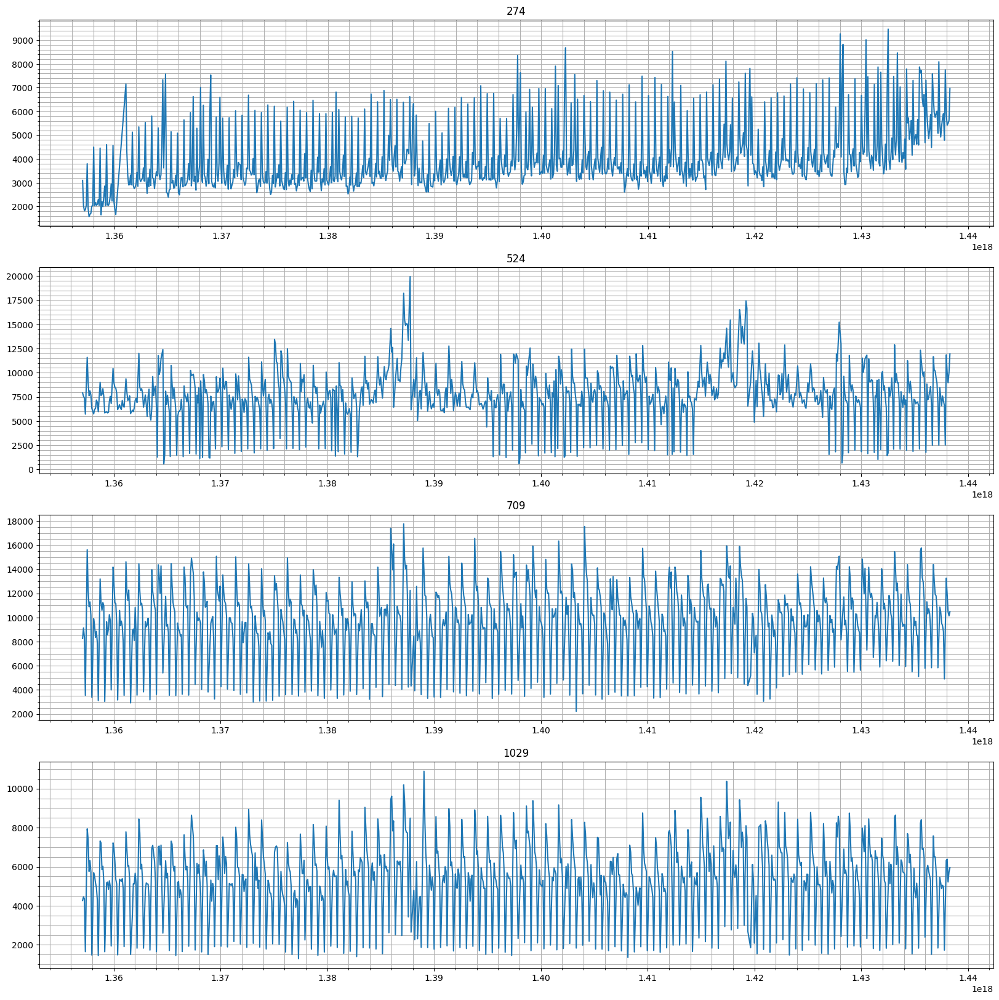

In [29]:
list_stores_to_check = [274, 524, 709, 1029]

plot_sales(stores_to_check, sales, '-')

<br>
Создадим столбец 'Delete' с пометкой на удаление значений ряда с датой меньшей указанной.<br>
Пометка на удаление будет равна True у странных рядов для дат меньших указанных в store_dates_to_remove

In [30]:
# моменты времени для указанных рядов до которых элементы рассматривать не будем

store_dates_to_remove = {   105:1.368e18, 163:1.368e18,
                            172:1.366e18, 364:1.37e18,
                            378:1.39e18, 523:1.39e18,
                            589:1.37e18, 663:1.39e18,
                            676:1.366e18, 681:1.37e18,
                            700:1.373e18, 708:1.368e18,
                            709:1.423e18, 730:1.39e18,
                            764:1.368e18, 837:1.396e18,
                            845:1.368e18, 861:1.368e18,
                            882:1.368e18, 969:1.366e18,
                            986:1.368e18, 192:1.421e18,
                            263:1.421e18, 500:1.421e18,
                            797:1.421e18, 815:1.421e18,
                            825:1.421e18   }

for store, date in store_dates_to_remove.items():
    sales.loc[(sales['Store'] == store) & (sales['DateInt'] < date), 'Delete'] = True

<br>
выведем странные ряды, удаленную часть выделим красным

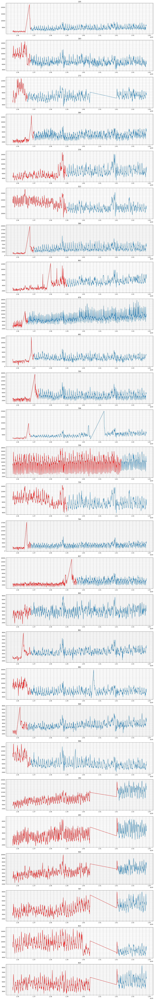

In [31]:
stores_to_check = [105, 163, 172, 364, 378, 523, 589, 663, 676, 681, 700, 708, 709, 
                   730, 764, 837, 845, 861, 882, 969, 986, 192, 263, 500, 797, 815, 825]

fig = plt.figure(figsize=(20, len(stores_to_check) * 5))


for i, store in enumerate(stores_to_check):
    
    cond = (sales['Set'] == 1) & (sales['Store'] == store) & (sales['Open'] == 1)
    cond1 = cond & (sales['Delete'] == True)
    cond2 = cond & (sales['Delete'] != True)

    X1 = sales.loc[cond1]
    y1 = sales.loc[cond1]['Sales']
    
    X2 = sales.loc[cond2]
    y2 = sales.loc[cond2]['Sales']
    
    plt.subplot(len(stores_to_check), 1, i+1)
    plt.plot(X1['DateInt'], y1, 'r-')
    plt.plot(X2['DateInt'], y2, '-')
    plt.minorticks_on()
    plt.grid(True, which='both')
    plt.title(store)


In [32]:
# удалим аномальные данные

sales = sales.loc[sales['Delete'] != True]

<br>
Пометим выбросы в рядах со значением модифицированного z-score >= 3

In [33]:
# метод возвращает true для точек у которых модифицированный z-score больше порога

def mad_based_outlier(points, thresh=3.5):
    if len(points.shape) == 1:
        points = points[:, None]
    
    median = np.median(points, axis=0)
    
    med_abs_deviation = np.median(np.absolute(points - median))

    modified_z_score = 0.6745 * (points - median) / med_abs_deviation

    return modified_z_score > thresh

In [34]:
# для каждого ряда пометим наблюдения-выбросы

for i in sales['Store'].unique():
    cond = (sales['Set'] == 1) & (sales['Store'] == i) & (sales['Open'] == 1)
    sales.loc[cond, 'Outlier'] = mad_based_outlier(sales.loc[cond]['Sales'], 3)

<br>
посмотрим на выбросы первых 10 рядов (магазинов):

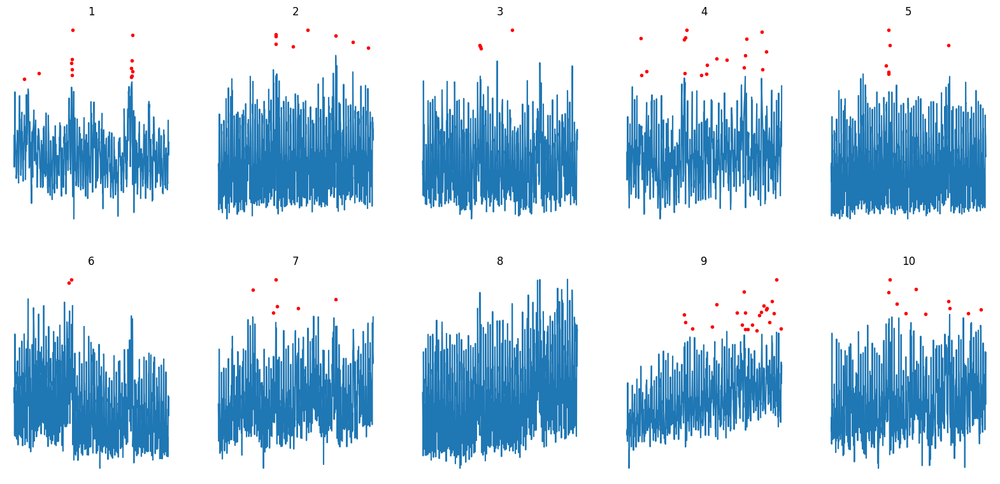

In [35]:
no_stores_to_check = 10

fig = plt.figure(figsize=(20, no_stores_to_check * 5))

for store in range(1, no_stores_to_check + 1):
    
    cond = (sales['Set'] == 1) & (sales['Store'] == store) & (sales['Open'] == 1)
    cond1 = cond & (sales['Outlier'] == False)
    cond2 = cond & (sales['Outlier'] == True)

    # нормальные sales
    X1 = sales.loc[cond1]
    y1 = sales.loc[cond1]['Sales']

    # выбросы
    X2 = sales.loc[cond2]
    y2 = sales.loc[cond2]['Sales']
    
    plt.subplot(10, 5, store)
    plt.plot(X1['Date'], y1, '-')
    plt.plot(X2['Date'], y2, 'r.')
    plt.title(store)
    plt.axis('off')


<br>
Разделим обучающие данные без выбросов на обучающие и проверочные наборы для дальнейшего заполнения выбросов предсказанными моделью xgboost значениями: 

In [36]:
cond = (sales['Set'] == 1) & (sales['Open'] == 1) & (sales['Outlier'] == False)

X_train, X_test, y_train, y_test = train_test_split(sales.loc[cond][features_x],
                                                    sales.loc[cond][features_y],
                                                    test_size = 0.1, 
                                                    random_state = 42)

In [37]:
# есть разные api для обучения xgboost, будем использовать тот, где обучающие данные нужно обернуть в DMatrix

dtrain = xgb.DMatrix(X_train, y_train)
dtest = xgb.DMatrix(X_test, y_test)

evallist = [(dtrain, 'train'), (dtest, 'test')]

In [38]:
num_round = 4000
seed = 42

param = {'bst:max_depth':12,
         'bst:eta':0.01,
         'subsample':0.8,
         'colsample_bytree':0.7,
         'silent':1,
         'objective':'reg:linear',
         'nthread':6,
         'seed':seed}

# параметры:
# subsample – доля обучающей подвыборки одного дерева
# colsample_bytree – доля подмножества колонок для обучения одного дерева
# silent - нужно ли печатать диагностику
# objective - тип задачи и тип модели (reg - задача регрессии, linear - линейная регрессия)
# nthread - количество потоков

# параметры обучения:
# feval - метрика
# verbose_eval - количество шагов бустинга для которых будет выводиться метрика
# early_stopping_rounds - количество шагов бустинга в течении которых если не было ни одного улучшения
#    метрики, то обучение заканчивается
# 2 аргумент - обучающий набор
# 3 аргумент - количество итераций бустинга
# 4 аргумент - валидационный набор


bst = xgb.train(param, dtrain, num_round, evallist, feval=rmspe_xg, verbose_eval=250, early_stopping_rounds=250)


[22:54:47] WARNING: c:\users\dev-admin\croot2\xgboost-split_1675461376218\work\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[22:54:47] WARNING: C:\Users\dev-admin\croot2\xgboost-split_1675461376218\work\src\learner.cc:767: 
Parameters: { "bst:eta", "bst:max_depth", "silent" } are not used.

[0]	train-rmse:5.78762	train-rmspe:0.99682	test-rmse:5.78707	test-rmspe:0.99682
[250]	train-rmse:0.11726	train-rmspe:0.18451	test-rmse:0.11863	test-rmspe:0.13085
[500]	train-rmse:0.10026	train-rmspe:0.16083	test-rmse:0.10328	test-rmspe:0.11395
[750]	train-rmse:0.09308	train-rmspe:0.12986	test-rmse:0.09751	test-rmspe:0.10837
[1000]	train-rmse:0.08868	train-rmspe:0.12227	test-rmse:0.09427	test-rmspe:0.10519
[1250]	train-rmse:0.08570	train-rmspe:0.11133	test-rmse:0.09239	test-rmspe:0.10334
[1500]	train-rmse:0.08353	train-rmspe:0.10683	test-rmse:0.09119	test-rmspe:0.10201
[1750]	train-rmse:0.08160	train-rmspe:0.10263	test-rmse:0.09027	test-rmspe:0.10101

In [39]:
# сделаем предсказания на выбросах и добавим их в данные

cond = (sales['Set'] == 1) & (sales['Open'] == 1) & (sales['Outlier'] == True)

# DMatrix выбросов
dpred = xgb.DMatrix(sales.loc[cond][features_x])

ypred_bst = bst.predict(dpred)

sales.loc[cond, 'SalesLog'] = ypred_bst
sales.loc[cond, 'Sales'] = np.exp(ypred_bst) - 1

<br>
Посмотрим на то какими стали выбросы первых 10 рядов (магазинов).<br>
Видно что точки стали ниже чем раньше.

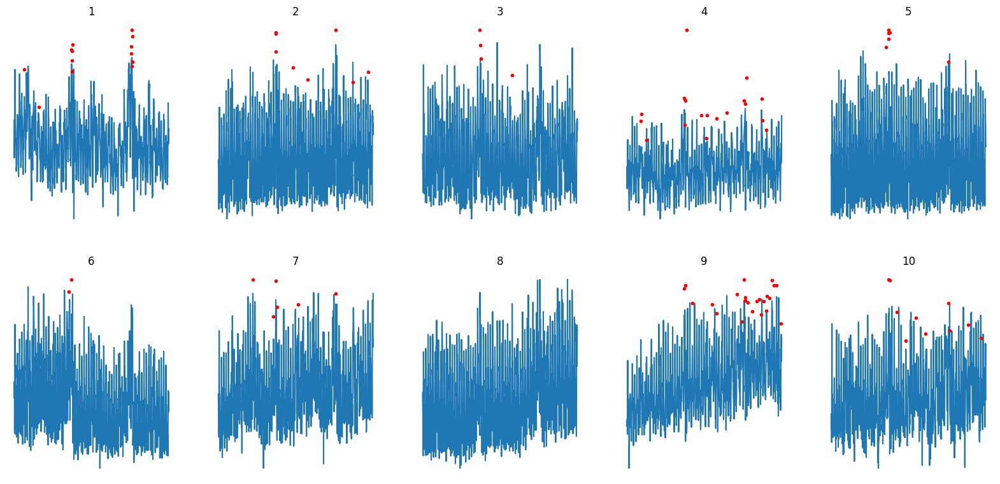

In [40]:
no_stores_to_check = 10

fig = plt.figure(figsize=(20, no_stores_to_check * 5))

for store in range(1,no_stores_to_check+1):
    
    cond = (sales['Set'] == 1) & (sales['Store'] == store) & (sales['Open'] == 1)
    cond1 = cond & (sales['Outlier'] == False)
    cond2 = cond & (sales['Outlier'] == True)

    # нормальные sales
    X1 = sales.loc[cond1]
    y1 = sales.loc[cond1]['Sales']

    # выбросы
    X2 = sales.loc[cond2]
    y2 = sales.loc[cond2]['Sales']
    
    plt.subplot(10, 5, store)
    plt.plot(X1['Date'], y1, '-')
    plt.plot(X2['Date'], y2, 'r.')
    plt.title(store)
    plt.axis('off')
    

In [41]:
sales

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Set,...,DateYear,DateDayOfYear,DateInt,StoreType,Assortment,CompetitionDistance,CompetitionOpenInt,PromoInterval0,Delete,Outlier
0,1,5,2015-07-31,5263.0,555.0,1.0,1,1,1,1,...,2015,212,1438300800000000000,2,0,1270.0,1220227200000000000,-1.0,NaN,False
1,2,5,2015-07-31,6064.0,625.0,1.0,1,1,1,1,...,2015,212,1438300800000000000,0,0,570.0,1193875200000000000,1.0,NaN,False
2,3,5,2015-07-31,8314.0,821.0,1.0,1,1,1,1,...,2015,212,1438300800000000000,0,0,14130.0,1164931200000000000,1.0,NaN,False
3,4,5,2015-07-31,13995.0,1498.0,1.0,1,1,1,1,...,2015,212,1438300800000000000,2,2,620.0,1251763200000000000,-1.0,NaN,False
4,5,5,2015-07-31,4822.0,559.0,1.0,1,1,1,1,...,2015,212,1438300800000000000,0,0,29910.0,1427846400000000000,-1.0,NaN,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1058238,1111,6,2015-08-01,NaN,NaN,1.0,0,1,0,0,...,2015,213,1438387200000000000,0,0,1900.0,1401580800000000000,1.0,NaN,NaN
1058239,1112,6,2015-08-01,NaN,NaN,1.0,0,1,0,0,...,2015,213,1438387200000000000,2,2,1880.0,1143849600000000000,-1.0,NaN,NaN
1058240,1113,6,2015-08-01,NaN,NaN,1.0,0,1,0,0,...,2015,213,1438387200000000000,0,2,9260.0,-9223372036854775808,-1.0,NaN,NaN
1058241,1114,6,2015-08-01,NaN,NaN,1.0,0,1,0,0,...,2015,213,1438387200000000000,0,2,870.0,-9223372036854775808,-1.0,NaN,NaN


<br>
Сделаем индексацию sales по 'Store' и 'Date':

In [42]:
sales_init = sales.copy()

sales = sales.copy().sort_values(by = ['Date']).set_index('Date')
sales.index = sales.index.to_period('D')
sales = sales.set_index('Store', append=True).sort_index(level = 1).swaplevel()

In [43]:
sales

DayOfWeek   Sales  Customers  Open  Promo  StateHoliday  \
Store Date                                                                  
1     2013-01-01          2     0.0        0.0   0.0      0             2   
      2013-01-02          3  5530.0      668.0   1.0      0             1   
      2013-01-03          4  4327.0      578.0   1.0      0             1   
      2013-01-04          5  4486.0      619.0   1.0      0             1   
      2013-01-05          6  4997.0      635.0   1.0      0             1   
...                     ...     ...        ...   ...    ...           ...   
1115  2015-09-13          7     NaN        NaN   0.0      0             1   
      2015-09-14          1     NaN        NaN   1.0      1             1   
      2015-09-15          2     NaN        NaN   1.0      1             1   
      2015-09-16          3     NaN        NaN   1.0      1             1   
      2015-09-17          4     NaN        NaN   1.0      1             1   

                  SchoolHoliday  Set      Id  SalesLog  ...  DateYear  \
Store Date                                              ...             
1     2013-01-01              1    1     NaN  0.000000  ...      2013   
      2013-01-02              1    1     NaN  8.618124  ...      2013   
      2013-01-03              1    1     NaN  8.372861  ...      2013   
      2013-01-04              1    1     NaN  8.408940  ...      2013   
      2013-01-05              1    1     NaN  8.516793  ...      2013   
...                         ...  ...     ...       ...  ...       ...   
1115  2015-09-13              0    0  4280.0       NaN  ...      2015   
      2015-09-14              0    0  3424.0       NaN  ...      2015   
      2015-09-15              0    0  2568.0       NaN  ...      2015   
      2015-09-16              0    0  1712.0       NaN  ...      2015   
      2015-09-17              0    0   856.0       NaN  ...      2015   

                  DateDayOfYear              DateInt  StoreType  Assortment  \
Store Date                                                                    
1     2013-01-01              1  1356998400000000000          2           0   
      2013-01-02              2  1357084800000000000          2           0   
      2013-01-03              3  1357171200000000000          2           0   
      2013-01-04              4  1357257600000000000          2           0   
      2013-01-05              5  1357344000000000000          2           0   
...                         ...                  ...        ...         ...   
1115  2015-09-13            256  1442102400000000000          3           2   
      2015-09-14            257  1442188800000000000          3           2   
      2015-09-15            258  1442275200000000000          3           2   
      2015-09-16            259  1442361600000000000          3           2   
      2015-09-17            260  1442448000000000000          3           2   

                  CompetitionDistance   CompetitionOpenInt  PromoInterval0  \
Store Date                                                                   
1     2013-01-01               1270.0  1220227200000000000            -1.0   
      2013-01-02               1270.0  1220227200000000000            -1.0   
      2013-01-03               1270.0  1220227200000000000            -1.0   
      2013-01-04               1270.0  1220227200000000000            -1.0   
      2013-01-05               1270.0  1220227200000000000            -1.0   
...                               ...                  ...             ...   
1115  2015-09-13               5350.0 -9223372036854775808             3.0   
      2015-09-14               5350.0 -9223372036854775808             3.0   
      2015-09-15               5350.0 -9223372036854775808             3.0   
      2015-09-16               5350.0 -9223372036854775808             3.0   
      2015-09-17               5350.0 -9223372036854775808             3.0   

                  Delet

<br>

### Анализ временных рядов

- Сезонные графики (сезоны - неделя, месяц, год)
- Функция автокорреляции (ACF) и функция частичной автокорреляции (PACF)
- Сезонная декомпозиция (STL-декомпозиция) использующая скользящее среднее
- Периодограмма
- Периодограмма для десезонированного ряда (убраны сезоны за 2 недели и месяц)
- график запаздывания для 30 лагов для десезонированного ряда (убраны сезоны за 2 недели и месяц)

<br>
сезонные графики для первого магазина (сезоны - неделя, месяц, год)

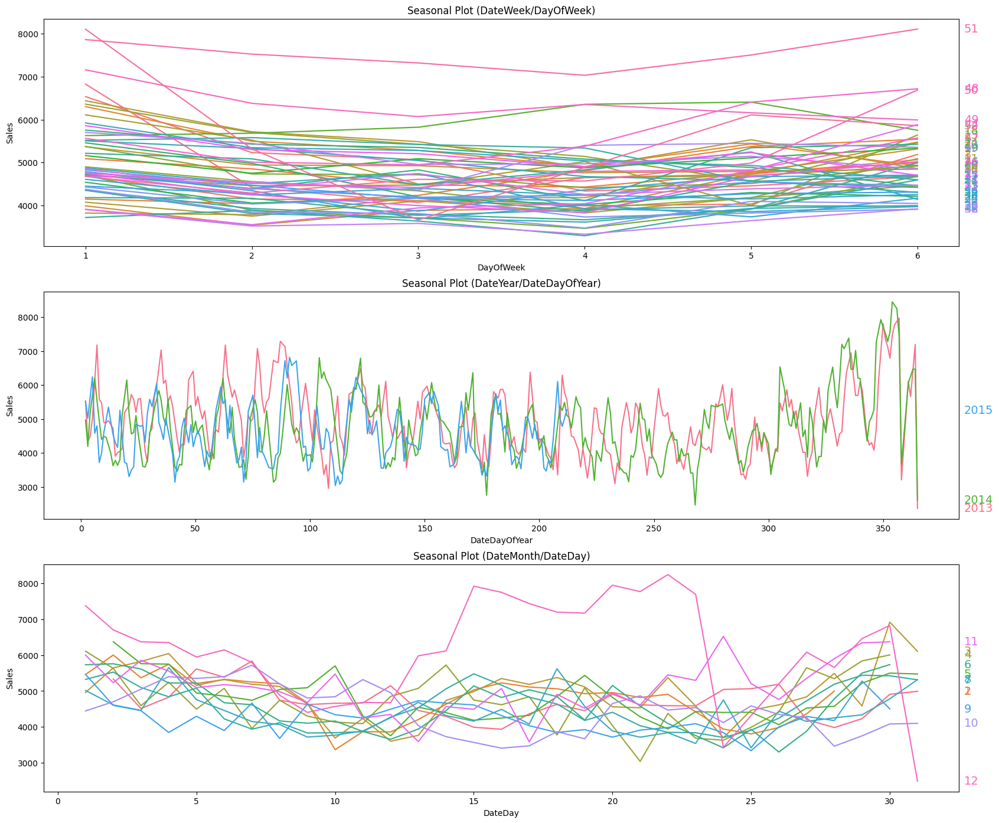

In [44]:
sales_store1 = sales[(sales['Set'] == 1) & (sales['Open'] == 1)].loc[(1,)]

fig, (ax0, ax1, ax2) = plt.subplots(3, 1, figsize=(20, 17))
seasonal_plot(sales_store1, y="Sales", period="DateWeek",  freq="DayOfWeek",     ax=ax0)
seasonal_plot(sales_store1, y="Sales", period="DateYear",  freq="DateDayOfYear", ax=ax1);
seasonal_plot(sales_store1, y="Sales", period="DateMonth", freq="DateDay",       ax=ax2);

<br>
функция автокорреляции (ACF) и функция частичной автокорреляции (PACF) для первого магазина

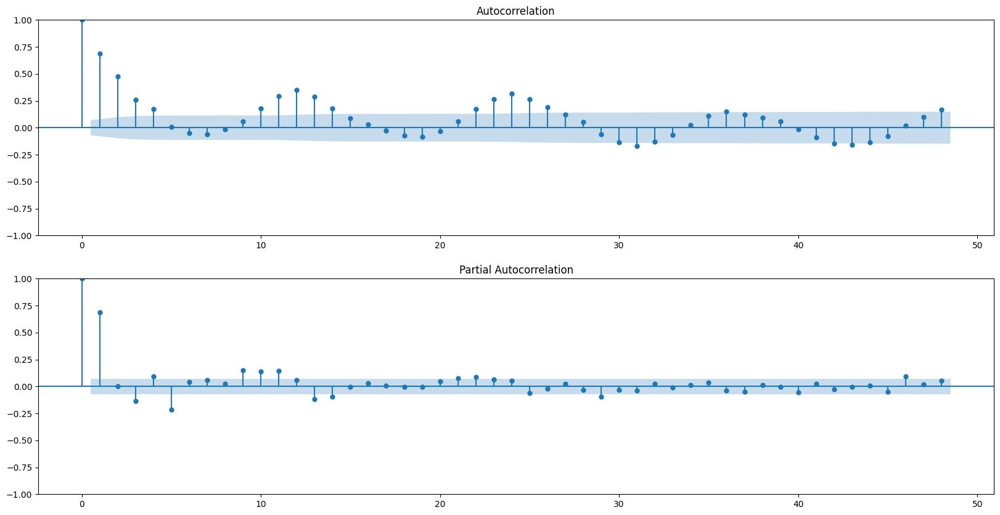

In [45]:
fig = plt.figure(figsize=(20, 10))

ax = plt.subplot(211)

# функция автокорреляции (ACF)
sm.graphics.tsa.plot_acf(sales_store1['Sales'].dropna(), lags=48, ax=ax);

ax = plt.subplot(212)

# функция частичной автокорреляции (PACF)
sm.graphics.tsa.plot_pacf(sales_store1['Sales'].dropna(), lags=48, ax=ax);

<br>
Сезонная декомпозиция (STL-декомпозиция) использующая скользящее среднее для 1-го магазина:

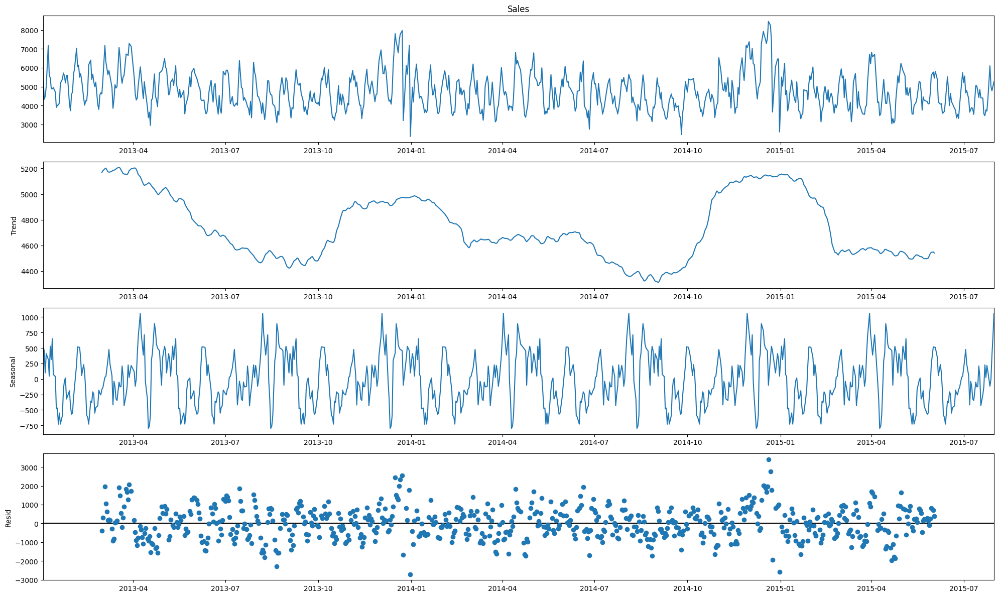

In [46]:
fig = plt.rc("figure", figsize=(20, 12))

sales_store1_decompose = sales_store1.copy()
sales_store1_decompose.index = sales_store1_decompose.index.to_timestamp()
sales_store1_decompose = sales_store1_decompose.asfreq('D')

sm.tsa.seasonal_decompose(sales_store1_decompose['Sales'].dropna(), period=100).plot();

<br>
Периодограмма для 1-го магазина

<Axes: title={'center': 'Periodogram'}, ylabel='Variance'>

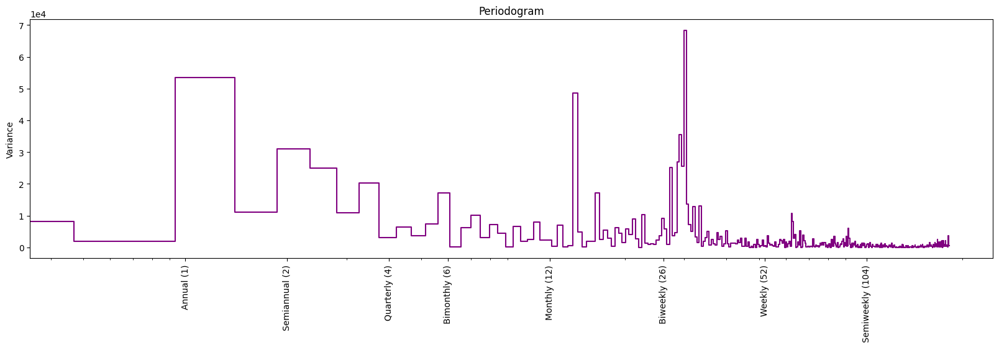

In [47]:
# частоты смещены относительно меток оси, поскольку в ряду не все дни подряд, нерабочие удалены.
# В методе periodogram все значения должны соответствовать одинаковой частоте.

fig = plt.rc("figure", figsize=(20, 5))

plot_periodogram(sales_store1['Sales'].dropna())

<Axes: title={'center': 'Periodogram'}, ylabel='Variance'>

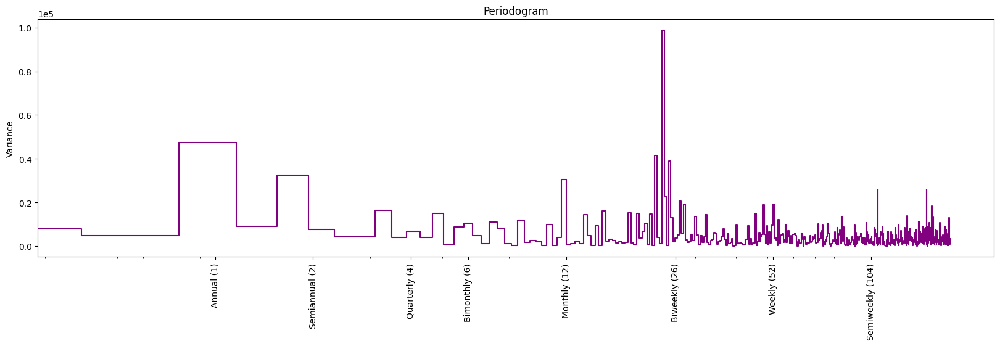

In [48]:
# заполним нерабочие дни шумовым значением чтобы для периодограммы все значения были с одинаковой частотой 
# и метки не были смещены.

# видно, что наибольшая мощность у сезонов соттветствующим году, двум неделям, месяцу

fig = plt.rc("figure", figsize=(20, 5))

plot_periodogram(sales[(sales['Set'] == 1)].loc[(1,)]['Sales']
                 .apply(lambda s : s if s != 0 else np.random.rand(1)[0] * 10000))

<br>
Удалим из ряда скользящее среднее с окном большим чем месяц и 2 недели - два самых выраженных сезона,
чтобы посмотреть на ряд без более продолжительных сезонов:

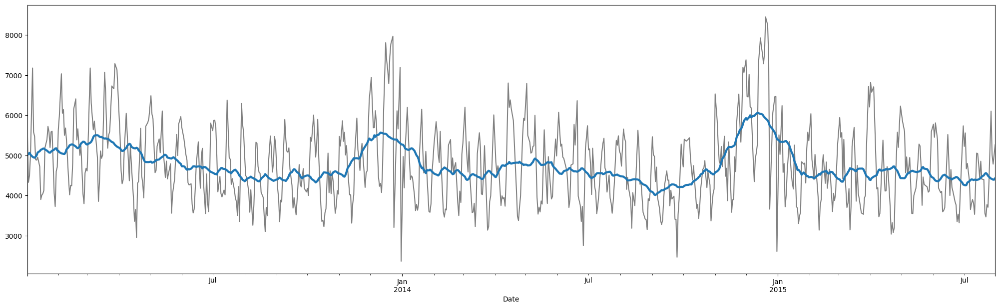

In [49]:
sales_store1_moving_average = sales_store1['Sales'].dropna().rolling(
    window=40,       
    center=True,     
    min_periods=20,  
).mean()             


fig = plt.figure(figsize=(25, 7))

ax = sales_store1['Sales'].dropna().plot(style="-", color="0.5")

sales_store1_moving_average.plot(ax=ax, linewidth=3, legend=False);

<Axes: title={'center': 'Periodogram'}, ylabel='Variance'>

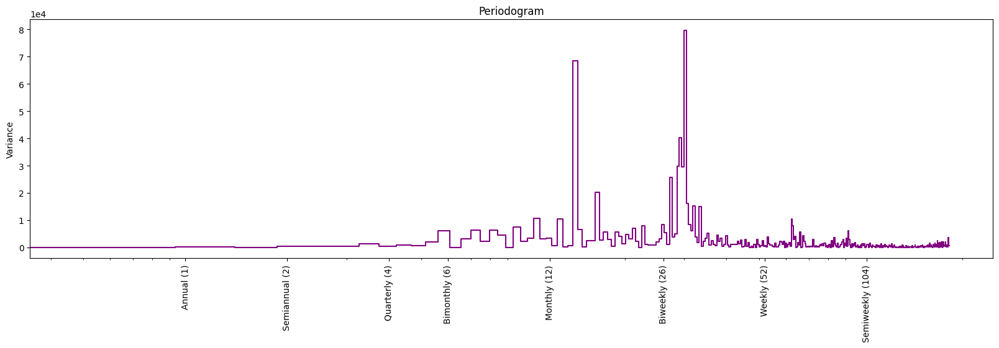

In [50]:
plot_periodogram(sales_store1['Sales'].dropna() - sales_store1_moving_average)

<br>
график запаздывания для 30 лагов для десезонированного (убраны сезоны за 2 недели и месяц) ряда продаж 1-го магазина:

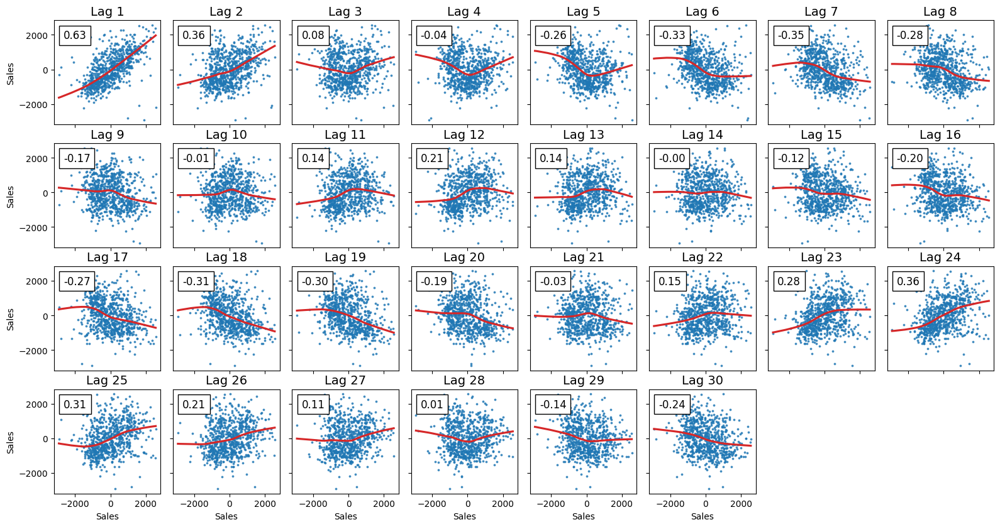

In [51]:
plot_lags(sales_store1['Sales'].dropna() - sales_store1_moving_average, lags=30, nrows=4);

<br>
Заполним значения когда магазин закрыт медианой соседних значений, чтобы не выбрасывать такие моменты времени при создании признаков.<br>
Обучение будет происходить только на данных где магазин открыт.

In [52]:
stores = list({store for (store, date) in sales.index})  # лучше через get_level_values

sales_reindexed = sales.copy()

for store in stores:
    
    sales_open0 = sales[(sales.index.get_level_values(0) == store) & (sales['Set'] == 1)]
    
    sales_open0_moving_average = sales_open0['Sales'].rolling(
        window = 7,       
        center = True,      
        min_periods = 3,  
    ).median()   

    sales_temp_store = sales_open0.copy()
    
    sales_temp_store.loc[(sales_open0['Open'] == 0), 'Sales'] = \
            sales_open0_moving_average[sales_open0['Open'] == 0]
    
    
    sales.loc[(sales.index.get_level_values(0) == store) & 
              (sales['Set'] == 1), 'Sales'] = sales_temp_store['Sales']

<Axes: xlabel='Date'>

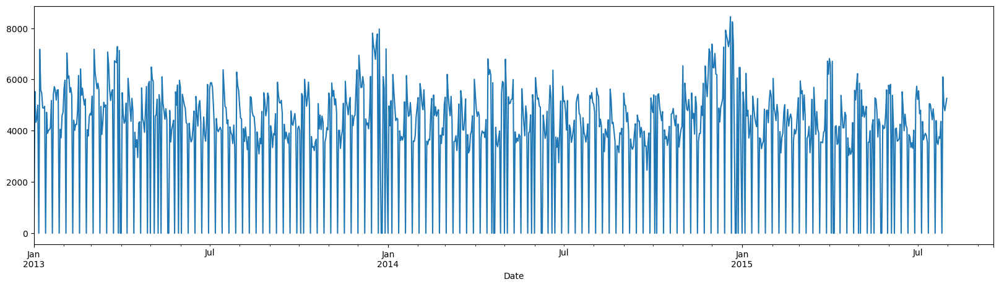

In [53]:
# до заполнения (1й магазин)

fig = plt.figure(figsize=(20, 5))

sales_reindexed.loc[(1,)]['Sales'].plot()

<Axes: xlabel='Date'>

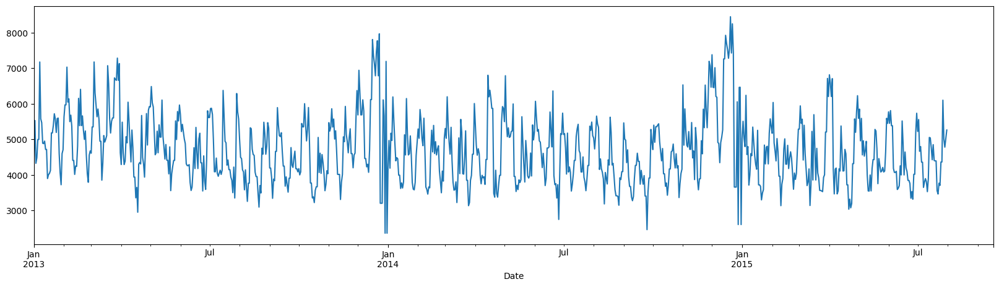

In [54]:
# после заполнения (1й магазин)

sales.loc[(1,)]['Sales'].plot()

In [55]:
# номера всех магазинов
stores = list({store for (store, date) in sales.index})       # лучше через get_level_values

# номера магазинов из тестового набора
stores_set0 = list({store for (store, date) in sales[(sales['Set'] == 0)].index})      

# столбец для предсказания продаж
sales_with_predicts = sales.copy()
sales_with_predicts['Sales_LR_Predict'] = np.nan

In [56]:
# создадим признаки лага

sales_with_predicts['lag_28'] = np.nan
sales_with_predicts['lag_14'] = np.nan
sales_with_predicts['lag_7'] = np.nan
#sales_with_predicts['lag_6'] = np.nan
#sales_with_predicts['lag_5'] = np.nan
#sales_with_predicts['lag_4'] = np.nan
#sales_with_predicts['lag_3'] = np.nan
sales_with_predicts['lag_2'] = np.nan
sales_with_predicts['lag_1'] = np.nan

#sales_with_predicts['lag_21'] = np.nan
#sales_with_predicts['lag_42'] = np.nan
#sales_with_predicts['lag_365'] = np.nan

# признак наличия акции в данный день в магазине улучшает качество модели
features_x_lr = ['Promo']

<br>

### Обучение и прогнозирование
<br>

**Примечания**:<br>
- Предсказания для рядов с разрывом [192, 263, 500, 797, 815, 825], которые мы укорачивали, расходятся при использовании признаков Фурье, поэтому их будем моделировать отдельно.<br>
- Ряды которые переобучаются при признаках лага и скользящих статистиках:<BR>
1, 28, 34, 121, 122, 124, 166, 240, 241, 340, 443, 480, 566, 664, 671, 744, 755, 840, 938, 952, 990, 1014, 1088, 1091

короткие ряды - [192, 263, 500, 797, 815, 825]
    
**модель** - LinearRegression

**признаки модели для обычных рядов**:
  - константный
  - признак тренда 2 порядка
  - признак Фурье порядка 6 для годового сезона
  - сезонные индикаторы дня недели, дня месяца
  - индикатор Нового года, индикатор 22 или 23 числа декабря
  - Promo - проходит ли акция в этот день
  - лаги: 1, 2, 7, 14, 28, 42
  - скользящие статистики: медиана с окном 28, матожидание с окном 28, стандартное отклонение с окном 14, сумма с окном 28

**признаки модели для коротких рядов**:
  - константный
  - сезонные индикаторы дня недели, дня месяца
  - индикатор Нового года, индикатор 22 или 23 числа декабря
  - Promo - проходит ли акция в этот день

In [57]:
# метод создания признаков

def create_features(data, is_train = True, is_short_ts = False, dp = None):
    """
    Params:
        data - данные продаж
        is_train - необходимо сформировать признаки для обучения или предсказания
        is_short_ts - необходимо сформировать признаки для обычного или короткого ряда
        dp - экземпляр объекта признаков DeterministicProcess.
            Создается в методе в случае если is_train=True
    Returns: 
        dp_X - вектор признаков
        dp - экземпляр объекта признаков DeterministicProcess.
            Возвращается если is_train=True
    """
    
    def create_lag_features(X, data, lags):
        for lag in lags:
            X['lag_' + str(lag)] = data['Sales'].shift(lag).fillna(0.0)
        return X
    
    def create_moving_features(X, data, windows):
        moving_data = [data['Sales'].shift(1).rolling(window=window, min_periods=1) for window in windows]
        X['moving_median'] = moving_data[0].median().fillna(0)
        X['moving_mean']   = moving_data[1].mean().fillna(0)
        X['moving_std']    = moving_data[2].std().fillna(0)
        X['moving_sum']    = moving_data[3].sum().fillna(0)
        return X
    
    
    if is_train:
        fourier = CalendarFourier(freq='A', order=6)  

        if not is_short_ts:
            dp = DeterministicProcess(
                    index=data['Sales'].dropna().index,                 # времена из обучающего набора
                    constant=True,                                      # константный признак
                    order=2,                                            # признак тренда 2 порядка
                    additional_terms = [fourier],                       # признак Фурье
                    drop=True,                                          # некоторые признаки будут удалены, если найдена 
            )                                                           # идеальная коллинеарность между какими-то признаками
        else:
            dp = DeterministicProcess(
                    index=data['Sales'].dropna().index,                # времена из обучающего набора
                    constant=True,                                     # константный признак
                    drop=True,                                         # некоторые признаки будут удалены, если найдена 
            )                                                          # идеальная коллинеарность между какими-то признаками

    dp_X = pd.concat([dp.in_sample() if is_train else dp.out_of_sample(steps = 48), 
                      pd.get_dummies(data['DayOfWeek'], prefix='DayOfWeek'),
                      pd.get_dummies(data['DateDay'], prefix='DateDay'), 
                      data[features_x_lr]], 
                      axis=1)

    dp_X['predNG'] = ((dp_X.index.day == 31) & (dp_X.index.month == 12))
    dp_X['22or23dec'] = ((dp_X.index.day.isin([22, 23])) & (dp_X.index.month == 12))
    
    if (is_train):
        if not is_short_ts:
            dp_X = create_lag_features(dp_X, data, lags = [28, 14, 7, 1, 2, 42])
            dp_X = create_moving_features(dp_X, data, windows = [28, 28, 14, 28])
    
        return dp_X, dp
    
    return dp_X
    

<br>
Цикл обучения:

In [58]:

for store in stores:
    
    sales_store = sales.copy()[(sales['Set'] == 1)].loc[(store, )]
    lr_y = sales_store['Sales'].copy()
    
    is_short_ts = store in [192, 263, 500, 797, 815, 825]
    
    # создание признаков
    dp_X, dp = create_features(sales_store, is_train = True, is_short_ts = is_short_ts)
    # обучение только на данных где магазин открыт
    dp_X = dp_X[sales_store['Open'] == 1]
    lr_y = lr_y[sales_store['Open'] == 1]

    # обучение и предсказание для обучающего набора
    lr = LinearRegression().fit(dp_X, lr_y)
 
    sales_with_predicts.loc[(sales_with_predicts.index.get_level_values(0) == store) & 
                            (sales_with_predicts['Set'] == 1) & 
                            (sales_with_predicts['Open'] == 1), 'Sales_LR_Predict'] = lr.predict(dp_X)

    if (store not in stores_set0): continue    # пропускаем магазины не из тестового набора
   
    sales_store_set0 = sales.copy()[(sales['Set'] == 0)].loc[(store, )]

    # создание признаков для тестового набора (предсказаний)
    dp_X_set0 = create_features(sales_store_set0, is_train = False, is_short_ts = is_short_ts, dp = dp)

    sales_temp = sales.copy().loc[(store, )]['Sales'].to_numpy()
    predicts = []

    for (i, (index, row_X)) in enumerate(dp_X_set0.iterrows()):

        X = row_X.copy().to_numpy()

        if (not is_short_ts):
            lag_features = [sales_temp[i - 48 - lag:][0] for lag in [28, 14, 7, 1, 2, 42]]
            moving_median = np.median(sales_temp[i - 48 - 28 : i - 48])
            moving_mean = sales_temp[i - 48 - 28 : i - 48].mean()
            moving_std = sales_temp[i - 48 - 14 : i - 48].std()
            moving_sum = sales_temp[i - 48 - 28 : i - 48].sum()

            X = np.append(X, [*lag_features, moving_median, moving_mean, moving_std, moving_sum])

        y = lr.predict(X.reshape(1, X.shape[0]))
        predicts.append(y)
        sales_temp[i - 48] = y   


    sales_with_predicts.loc[(sales_with_predicts.index.get_level_values(0) == store) 
                          & (sales_with_predicts['Set'] == 0), 'Sales_LR_Predict'] = predicts.copy()


<br>
посмотрим на некоторые ряды вместе с прогнозами:

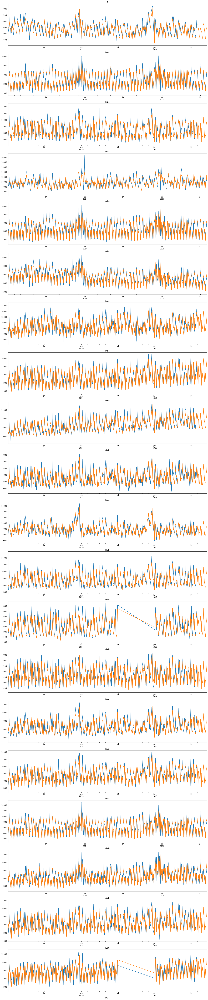

In [59]:
fig = plt.figure(figsize=(20, 20 * 5))

for i, store in enumerate(stores[:20]):
    plt.subplot(20, 1, i + 1)
    (sales_with_predicts[sales_with_predicts['Open'] == 1].loc[(store,)]['Sales']).plot(title=store)
    (sales_with_predicts[sales_with_predicts['Open'] == 1].loc[(store,)]['Sales_LR_Predict']).plot(title=store)

<br>
функция автокорреляции (ACF) и функция частичной автокорреляции (PACF) полученных остатков для первого магазина

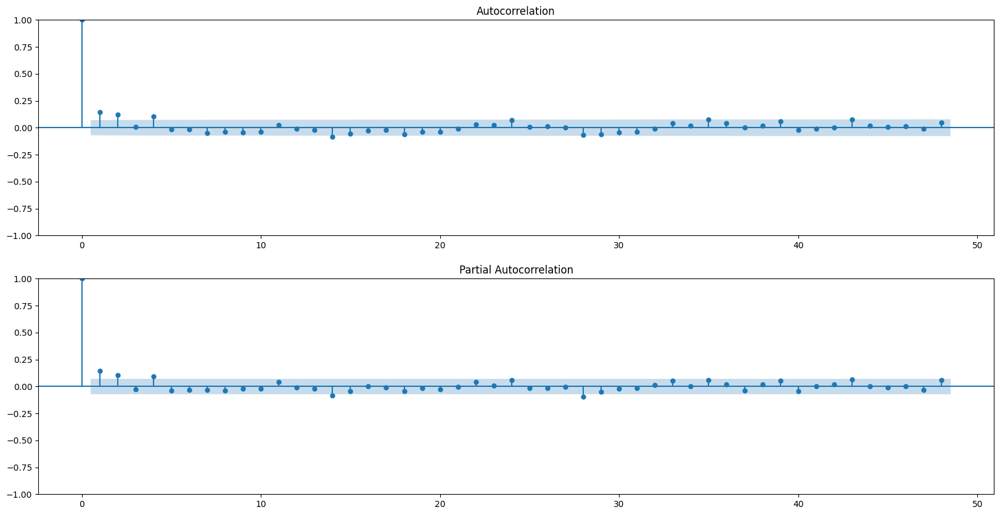

In [60]:
# автокорреляция и частичная автокорреляция остатков

fig = plt.figure(figsize=(20, 10))

cond1 = (sales_with_predicts['Set'] == 1) & (sales_with_predicts['Open'] == 1)
cond2 = (sales_with_predicts['Set'] == 1) & (sales_with_predicts['Open'] == 1)

s = sales_with_predicts.loc[cond1].loc[(1,)]['Sales']
r = sales_with_predicts.loc[cond2].loc[(1,)]['Sales_LR_Predict']

ax = plt.subplot(211)
sm.graphics.tsa.plot_acf(s - r, lags=48, ax=ax);

ax = plt.subplot(212)
sm.graphics.tsa.plot_pacf(s - r, lags=48, ax=ax);

<Figure size 2000x500 with 0 Axes>

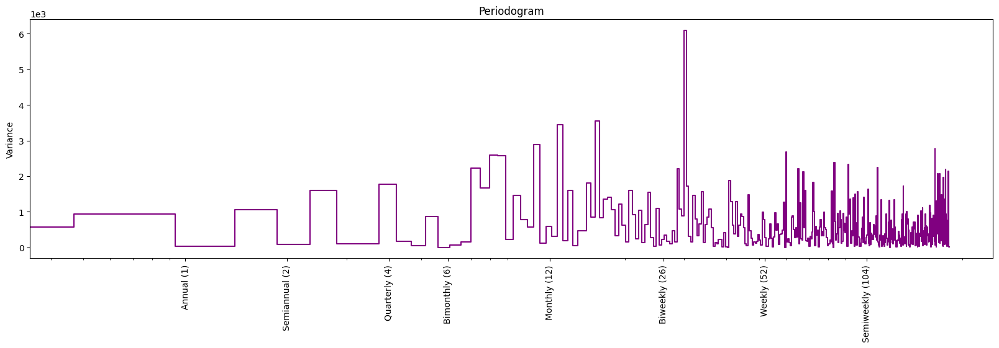

In [61]:
fig = plt.figure(figsize=(20, 5))

plot_periodogram(s-r);

In [62]:
predicts = sales_with_predicts.reset_index()

predicts.loc[predicts['Open'] == 0, 'Sales_LR_Predict'] = 0

<br>
Экспорт прогнозов:

In [63]:
X_submit = predicts.loc[predicts['Set'] == 0]

ypred = predicts.loc[predicts['Set'] == 0, 'Sales_LR_Predict']

df_ypred = X_submit['Id'].reset_index()
del df_ypred['index']
df_ypred['Id'] = df_ypred['Id'].astype('int')

df_ypred['Sales'] = ypred.to_numpy() * 0.97  # * 0.97  улучшает качество прогнозов

df_ypred.sort_values('Id', inplace=True)
df_ypred[['Id', 'Sales']].to_csv('rossmann_best_no_ext_data_scaled.csv', index=False)